In [1]:
import os
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
import tensorflow.keras as keras
import keras.backend as K
import tensorflow.keras.layers as L
from glob import glob
from PIL import Image
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, MaxPool2D, Add, Dropout, Concatenate, Conv2DTranspose, Dense, Reshape, Flatten, Softmax, Lambda, UpSampling2D, AveragePooling2D, Activation, BatchNormalization, GlobalAveragePooling2D, SeparableConv2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.metrics import BinaryAccuracy, Precision, Recall
from sklearn.model_selection import train_test_split
from tensorflow.keras.regularizers import l2

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: l

## Load data

In [2]:
#@title Creating Data Pipeline and Data Preprocessing

train_directory = '/kaggle/input/tnbc-seg/MonuSeg/MonuSeg/Training'
test_directory = '/kaggle/input/tnbc-seg/MonuSeg/MonuSeg/Test'

SIZE = 256
batch_size = 8
image_dataset = []
mask_dataset = []

def load_dataset(path1, path2, split=0.2):
    images = sorted(glob(os.path.join(path1, "TissueImages", "*.png")))
    masks = sorted(glob(os.path.join(path1, "GroundTruth", "*.png")))

    split_size = int(len(images) * split)

    train_x, valid_x = train_test_split(images, test_size=split_size, random_state=42)
    train_y, valid_y = train_test_split(masks, test_size=split_size, random_state=42)

    test_x = sorted(glob(os.path.join(path2, "TissueImages", "*.tif")))
    test_y = sorted(glob(os.path.join(path2, "GroundTruth", "*.png")))

    return (train_x, train_y), (valid_x, valid_y), (test_x, test_y)

def read_image(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_COLOR)
    x = cv2.resize(x, (SIZE, SIZE))
    x = x / 255.0
    x = x.astype(np.float32)
    return x

def read_mask(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    x = cv2.resize(x, (SIZE, SIZE))
    x = x / 255.0
    x = x.astype(np.float32)
    x = np.expand_dims(x, axis=-1)
    return x

def tf_parse(x, y):
    def _parse(x, y):
        x = read_image(x)
        y = read_image(y)
        return x, y

    x, y = tf.numpy_function(_parse, [x, y], [tf.float32, tf.float32])
    x.set_shape([SIZE, SIZE, 3])
    y.set_shape([SIZE, SIZE, 3])
    return x, y

def tf_dataset(X, Y, batch=2):
    dataset = tf.data.Dataset.from_tensor_slices((X, Y))
    dataset = dataset.map(tf_parse)
    dataset = dataset.batch(batch)
    dataset = dataset.prefetch(10)
    return dataset


(train_x, train_y), (valid_x, valid_y), (test_x, test_y) = load_dataset(train_directory, test_directory)

print(f"Train: {len(train_x)} - {len(train_y)}")
print(f"Valid: {len(valid_x)} - {len(valid_y)}")
print(f"Test : {len(test_x)} - {len(test_y)}")

train_dataset = tf_dataset(train_x, train_y, batch=batch_size)
valid_dataset = tf_dataset(valid_x, valid_y, batch=batch_size)
test_dataset = tf_dataset(test_x, test_y, batch=batch_size)

Train: 24 - 24
Valid: 6 - 6
Test : 14 - 14


In [3]:
def load_image(path, size, mask=False):
    image = Image.open(path)
    image = image.resize((size, size))

    if mask:
        image = image.convert('L')  # Convert to grayscale
    else:
        image = image.convert('RGB')  # Convert to RGB
    
    image = np.array(image)
    return image

def load_data_testing(root_path, size):
    images = []
    masks = []

    image_folder = os.path.join(root_path, 'TissueImages')
    mask_folder = os.path.join(root_path, 'GroundTruth')

    for image_path in sorted(glob(os.path.join(image_folder, '*tif'))):
        img_id = os.path.basename(image_path).split('.')[0]
        mask_path = os.path.join(mask_folder, f'{img_id}_bin_mask.png')

        img = load_image(image_path, size) / 255.0
        mask = load_image(mask_path, size, mask=True) / 255.0

        images.append(img)
        masks.append(mask)

    return np.array(images), np.array(masks)

In [4]:
size = 256   # image size: 256x256
root_path = '/kaggle/input/tnbc-seg/MonuSeg/MonuSeg/Test'
X_test, y_test = load_data_testing(root_path, size)

In [5]:
print(f"X shape: {X_test.shape}     |  y shape: {y_test.shape}")

# prepare data to modeling
# X = np.expand_dims(X, -1)
y_test = np.expand_dims(y_test, -1)

print(f"\nX shape: {X_test.shape}  |  y shape: {y_test.shape}")

X shape: (14, 256, 256, 3)     |  y shape: (14, 256, 256)

X shape: (14, 256, 256, 3)  |  y shape: (14, 256, 256, 1)


#### Visualisation of testing images

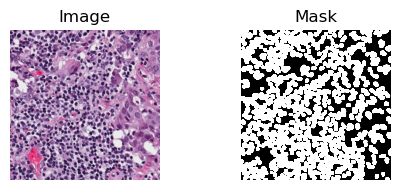

In [6]:
image = X_test[1]
mask = y_test[1]

fig, axes = plt.subplots(1, 2, figsize=(5, 2))
axes[0].imshow(image, cmap='gray')
axes[0].axis('off')
axes[0].set_title('Image')

axes[1].imshow(mask*255, cmap='gray', vmin=0, vmax=1)
axes[1].axis('off')
axes[1].set_title('Mask')

plt.tight_layout()
plt.show()

# Custom Metrics and losses

#### Metrics

In [7]:
def dice_score(y_true, y_pred):
    smooth = K.epsilon()
    y_true_flat = K.flatten(K.cast(y_true, 'float32'))
    y_pred_flat = K.flatten(y_pred)
    intersection = K.sum(y_true_flat * y_pred_flat)
    score = (2. * intersection + smooth) / (K.sum(y_true_flat) + K.sum(y_pred_flat) + smooth)
    return score

def iou(y_true, y_pred):
    smooth = K.epsilon()
    y_true_flat = K.flatten(K.cast(y_true, 'float32'))
    y_pred_flat = K.flatten(y_pred)
    intersection = K.sum(y_true_flat * y_pred_flat)
    union = K.sum(y_true_flat) + K.sum(y_pred_flat) - intersection + smooth
    iou = (intersection + smooth) / union
    return iou

def recall(y_true, y_pred):
    smooth = K.epsilon()
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    y_true_flat = K.flatten(K.cast(y_true, 'float32'))
    y_pred_flat = K.flatten(y_pred_pos)
    tp = K.sum(y_true_flat * y_pred_flat)
    fn = K.sum(y_true_flat * (1 - y_pred_flat))
    recall = (tp + smooth) / (tp + fn + smooth)
    return recall

def precision(y_true, y_pred):
    smooth = K.epsilon()
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    y_true_flat = K.flatten(K.cast(y_true, 'float32'))
    y_pred_flat = K.flatten(y_pred_pos)
    tp = K.sum(y_true_flat * y_pred_flat)
    fp = K.sum((1 - y_true_flat) * y_pred_flat)
    precision = (tp + smooth) / (tp + fp + smooth)
    return precision

#### Loss

In [8]:
def dice_loss(y_true, y_pred):
    loss = 1 - dice_score(y_true, y_pred)
    return loss

def iou_loss(y_true, y_pred):
    loss = 1 - iou(y_true, y_pred)
    return loss
    
def focal_loss(y_true, y_pred, gamma=2.0, alpha=0.25):
    epsilon = tf.keras.backend.epsilon()
    y_pred = tf.clip_by_value(y_pred, epsilon, 1.0 - epsilon)
    y_true = tf.cast(y_true, tf.float32)
    pt = tf.where(tf.equal(y_true, 1), y_pred, 1 - y_pred)
    focal_weight = alpha * tf.pow(1 - pt, gamma)
    loss = tf.reduce_mean(-focal_weight * tf.math.log(pt))
    return loss

def bce_loss(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=y_true, logits=y_pred))
    return loss

# Traversky Loss
!pip install keras-unet-collection
from keras_unet_collection import losses

def traversky_loss(y_true, y_pred):
    loss_trav = losses.focal_tversky(y_true, y_pred, alpha=0.5, gamma=4/3)
    return loss_trav


# Hybrid Loss
def hybrid_loss(y_true, y_pred):
    dice = dice_loss(y_true, y_pred)
    bce = bce_loss(y_true, y_pred)
    trav = traversky_loss(y_true, y_pred)
    total_loss = dice+trav+bce
    return total_loss

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.9/67.9 kB 697.7 kB/s eta 0:00:00a 0:00:01


#### Model

In [9]:
'''texts = [
    "tumor epithelial tissue",
    "necrotic tissue",
    "lymphocytic tissue",
    "tumor associated stromal tissue",
    "coagulative necrosis",
    "liquefactive necrosis",
    "desmoplasia",
    "granular and non granular leukocytes",
    "perinuclear halo",
    "interstitial space",
    "neutrophils",
    "macrophages",
    "collagen",
    "fibronectin",
    "hyperplasia",
    "dysplasia"
]'''

text = pd.read_csv('/kaggle/input/tnbc-seg/text_labels.csv', header=None)
text = tf.convert_to_tensor(np.asarray(text), dtype=tf.float32)

In [10]:
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import Concatenate
import numpy as np
import math
from itertools import combinations
import tensorflow_probability as tfp

class MahalanobisDistanceLayer(Layer):
    def __init__(self, top=None, **kwargs):
        super(MahalanobisDistanceLayer, self).__init__(**kwargs)
        self.top = top

    def mahalanobis_distance(self, tup):
        diff = tf.expand_dims(tup[0], axis=1)
        inv_diff = tf.expand_dims(tup[0], axis=-1)
        inv_cov_matrix = tup[1]
        calc = tf.einsum('ilj,ijk->ilk', inv_diff, diff)
        dist = tf.expand_dims(tf.sqrt(tf.einsum('ikl,ilk->i', inv_cov_matrix, calc)), axis=-1)
        return dist

    def similarity_compute(self, diff, cov_inv, *argv):
        L = len(argv)
        arg_shape = argv[0].shape

        similarities = []
        for i, arg in enumerate(argv):
            mahalanobis_sim = self.mahalanobis_distance((diff[:, i, :], cov_inv))
            similarities.append(mahalanobis_sim)

        similarities = Concatenate(axis=-1)(similarities)
        top_indices = tf.math.top_k(-similarities, k=self.top).indices

        filtered_maps = []
        argv = Concatenate(axis=-1)(argv)
        top_indices = tf.reshape(top_indices, [top_indices.shape[-1], -1])
        filtered_map = tf.gather(argv, top_indices[:, 0], axis=-1)
        filtered_maps.append(filtered_map)
        result = Concatenate(axis=-1)(filtered_maps)
        return result


    def call(self, inputs):
        l = []
        for i in range(inputs.shape[-1]):
            l.append(tf.expand_dims(inputs[:, :, :, i], axis=-1))
            
        flattened_outp = [tf.reshape(i, [-1, tf.shape(i)[1] * tf.shape(i)[2] * tf.shape(i)[3]]) for i in l]
        stacked_outp = tf.stack(flattened_outp, axis=1)
        
        mean = tf.reduce_mean(inputs, axis=-1, keepdims=True)
        mean = tf.reshape(mean, [-1, tf.shape(mean)[1] * tf.shape(mean)[2] * tf.shape(mean)[3]])
        mean = [mean for i in l]
        mean = tf.stack(mean, axis=1)
        diff = stacked_outp - mean
        
        cov_matrix = tf.einsum('ijk,ijl->ikl', diff, diff) / tf.cast(tf.shape(stacked_outp)[1], tf.float32)
        x = tf.eye(cov_matrix.shape[-2], num_columns=cov_matrix.shape[-1], batch_shape=cov_matrix.shape[0])*0.000001    
        cov_matrix = cov_matrix[:] + x
        inv_covariance_matrix = tf.linalg.inv(cov_matrix)
        predictions = self.similarity_compute(diff, inv_covariance_matrix, *l)
        return predictions

In [11]:
class AckleyFunctionLayer(tf.keras.layers.Layer):
    def __init__(self, top=2, mode='base', **kwargs):
        super(AckleyFunctionLayer, self).__init__(**kwargs)
        self.top = top
        self.mode = mode
        self.conv = Conv2D(1, (1, 1), activation='sigmoid', padding='same')

    def fuzzy_scores(self, CF):
        k = 0.001; a = -0.0043; b = 1; c = 1; d = 1;
        R_L = (-a * tf.math.exp(-b * tf.sqrt((1/d) * (CF ** 2))) - tf.math.exp((1/d) * tf.math.cos(c * CF)) + a + math.exp(1)) + k

        K_L = tf.fill(tf.shape(R_L), 0.001)
        condition_1 = R_L[:, 0, :, :, :, :] > R_L[:, 1, :, :, :, :]
        updated_K_L_0_0 = tf.where(condition_1, R_L[:, 0, :, :, :, :], K_L[:, 0, :, :, :, :])
        condition_2 = R_L[:, 0, :, :, :, :] <= R_L[:, 1, :, :, :, :]
        updated_K_L_0_1 = tf.where(condition_2, R_L[:, 1, :, :, :, :], K_L[:, 1, :, :, :, :])
        updated_K_L = tf.concat([updated_K_L_0_0[:, tf.newaxis, :, :, :, :], updated_K_L_0_1[:, tf.newaxis, :, :, :, :]], axis=1)

        return updated_K_L

    def ackley_func(self, mean, *argv):
        L = len(argv)
        arg_shape = argv[0].shape
        t1 = argv[0]
        for i in range(1, L):
            t1 = tf.concat([t1, argv[i]], axis=0)

        CF = tf.zeros_like(t1, dtype=tf.float32)
        CF_first = tf.stack(argv, axis=1)
        CF_second = 1 - CF_first
        CF = tf.stack([CF_first, CF_second], axis=1)

        R_L = self.fuzzy_scores(CF)
        R_L = R_L[:, 0, :, :, :, :]
        temp1 = R_L[:, 0, :, :, :]
        temp2 = mean
        for i in range(1, L):
            temp1 = Concatenate(axis=-1)([temp1, R_L[:, i, :, :, :]])
            mean = Concatenate(axis=-1)([mean, temp2])
        atten_scores = mean * temp1

        return atten_scores

    def call(self, inputs, text_lab):
        if self.mode == "text":
            space = tf.math.multiply(tf.transpose(text_lab, perm=[0,2,1,3]),text_lab)
            space = tf.math.multiply(inputs, tf.transpose(space, perm=[0,2,1,3]))
            inputs = inputs*self.conv(space)
        elif self.mode == "base":
            inputs = inputs
        elif self.mode == "clip":
            inputs = inputs
        
        l = []
        for i in range(inputs.shape[-1]):
            l.append(tf.expand_dims(inputs[:, :, :, i], axis=-1))

        atten_scores = self.ackley_func(tf.reduce_mean(inputs, axis=-1, keepdims=True),*l)
        predictions = inputs * atten_scores
        return predictions

In [12]:
def standard_unit(input_tensor, stage, nb_filter, kernel_size=3):
    act = 'elu'

    x = Conv2D(nb_filter, (kernel_size, kernel_size), activation=act, name='conv'+stage+'_1', kernel_initializer = 'he_normal', padding='same', kernel_regularizer=l2(1e-4))(input_tensor)
    x = Dropout(0.1, name='dp'+stage+'_1')(x)
    x = Conv2D(nb_filter, (kernel_size, kernel_size), activation=act, name='conv'+stage+'_2', kernel_initializer = 'he_normal', padding='same', kernel_regularizer=l2(1e-4))(x)
    x = Dropout(0.1, name='dp'+stage+'_2')(x)

    return x

def unetplusplus(input_shape, deep_supervision=False, text=text):

    nb_filter = [32,64,128,256,512]
    act = 'elu'
    
    text = Dense(64, activation='relu')(text)
    text = Dense(64, activation='relu')(tf.transpose(text, perm=[1,0]))
    text = tf.expand_dims(text, axis=0)
    text = tf.expand_dims(text, axis=-1)

    bn_axis = 3
    img_input = Input(shape=input_shape, name='main_input')

    x = tf.image.sobel_edges(img_input)
    sobel_x = x[:, :, :, :, 0]
    sobel_y = x[:, :, :, :, 1]

    sobel_combined = tf.sqrt(tf.square(sobel_x) + tf.square(sobel_y))

    add_input = Concatenate(axis=-1, name="concatenate_input")([img_input, sobel_combined])

    conv1_1 = standard_unit(add_input, stage='11', nb_filter=nb_filter[0])
    pool1 = MaxPool2D((2, 2), strides=(2, 2), name='pool1')(conv1_1)

    conv2_1 = standard_unit(pool1, stage='21', nb_filter=nb_filter[1])
    pool2 = MaxPool2D((2, 2), strides=(2, 2), name='pool2')(conv2_1)

    up1_2 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up12', padding='same')(conv2_1)
    conv1_2 = Concatenate(name='merge12', axis=bn_axis)([up1_2, conv1_1])
    conv1_2 = standard_unit(conv1_2, stage='12', nb_filter=nb_filter[0])

    conv3_1 = standard_unit(pool2, stage='31', nb_filter=nb_filter[2])
    conv3_1 = AckleyFunctionLayer(top=2, mode='base')(conv3_1, text)
    pool3 = MaxPool2D((2, 2), strides=(2, 2), name='pool3')(conv3_1)

    up2_2 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up22', padding='same')(conv3_1)
    conv2_2 = Concatenate(name='merge22', axis=bn_axis)([up2_2, conv2_1])
    conv2_2 = standard_unit(conv2_2, stage='22', nb_filter=nb_filter[1])

    up1_3 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up13', padding='same')(conv2_2)
    conv1_3 = Concatenate(name='merge13', axis=bn_axis)([up1_3, conv1_1, conv1_2])
    conv1_3 = standard_unit(conv1_3, stage='13', nb_filter=nb_filter[0])

    conv4_1 = standard_unit(pool3, stage='41', nb_filter=nb_filter[3])
    pool4 = MaxPool2D((2, 2), strides=(2, 2), name='pool4')(conv4_1)
    
    up3_2 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up32', padding='same')(conv4_1)
    conv3_2 = Concatenate(name='merge32', axis=bn_axis)([up3_2, conv3_1])
    conv3_2 = standard_unit(conv3_2, stage='32', nb_filter=nb_filter[2])
    
    conv3_2 = AckleyFunctionLayer(top=2, mode='text')(conv3_2, text)
    up2_3 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up23', padding='same')(conv3_2)
    conv2_3 = Concatenate(name='merge23', axis=bn_axis)([up2_3, conv2_1, conv2_2])
    conv2_3 = standard_unit(conv2_3, stage='23', nb_filter=nb_filter[1])

    up1_4 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up14', padding='same')(conv2_3)
    conv1_4 = Concatenate(name='merge14', axis=bn_axis)([up1_4, conv1_1, conv1_2, conv1_3])
    conv1_4 = standard_unit(conv1_4, stage='14', nb_filter=nb_filter[0])

    conv5_1 = standard_unit(pool4, stage='51', nb_filter=nb_filter[4])

    up4_2 = Conv2DTranspose(nb_filter[3], (2, 2), strides=(2, 2), name='up42', padding='same')(conv5_1)
    conv4_2 = Concatenate(name='merge42', axis=bn_axis)([up4_2, conv4_1])
    conv4_2 = standard_unit(conv4_2, stage='42', nb_filter=nb_filter[3])

    up3_3 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up33', padding='same')(conv4_2)
    conv3_3 = Concatenate(name='merge33', axis=bn_axis)([up3_3, conv3_1, conv3_2])
    conv3_3 = standard_unit(conv3_3, stage='33', nb_filter=nb_filter[2])

    up2_4 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up24', padding='same')(conv3_3)
    conv2_4 = Concatenate(name='merge24', axis=bn_axis)([up2_4, conv2_1, conv2_2, conv2_3])
    conv2_4 = standard_unit(conv2_4, stage='24', nb_filter=nb_filter[1])

    up1_5 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up15', padding='same')(conv2_4)
    conv1_5 = Concatenate(name='merge15', axis=bn_axis)([up1_5, conv1_1, conv1_2, conv1_3, conv1_4])
    conv1_5 = standard_unit(conv1_5, stage='15', nb_filter=nb_filter[0])

    nestnet_output_1 = Conv2D(3, (1, 1), activation='sigmoid', name='output_1', kernel_initializer = 'he_normal', padding='same', kernel_regularizer=l2(1e-4))(conv1_2)
    nestnet_output_2 = Conv2D(3, (1, 1), activation='sigmoid', name='output_2', kernel_initializer = 'he_normal', padding='same', kernel_regularizer=l2(1e-4))(conv1_3)
    nestnet_output_3 = Conv2D(3, (1, 1), activation='sigmoid', name='output_3', kernel_initializer = 'he_normal', padding='same', kernel_regularizer=l2(1e-4))(conv1_4)
    nestnet_output_4 = Conv2D(3, (1, 1), activation='sigmoid', name='output_4', kernel_initializer = 'he_normal', padding='same', kernel_regularizer=l2(1e-4))(conv1_5)

    if deep_supervision:
        model = Model(img_input, [nestnet_output_1,nestnet_output_2,nestnet_output_3,nestnet_output_4], name="unet++")
    else:
        model = Model(img_input, [nestnet_output_4], name="unetplusplus")

    return model


input_shape = (256, 256, 3)

model = unetplusplus(input_shape)
model.compile(tf.keras.optimizers.experimental.Nadam(lr=0.0001), loss=hybrid_loss, metrics=['accuracy', 'Precision', 'Recall', dice_score, iou])
model.summary()

Model: "unetplusplus"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 main_input (InputLayer)        [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 tf.compat.v1.shape (TFOpLambda  (4,)                0           ['main_input[0][0]']             
 )                                                                                                
                                                                                                  
 tf.__operators__.getitem (Slic  ()                  0           ['tf.compat.v1.shape[0][0]']     
 ingOpLambda)                                                                          

In [13]:
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath='/kaggle/working/model.h5',
    monitor='val_dice_score',
    save_best_only=True,
    save_weight_only=True,
    mode='max',
    verbose=1
    )

history = model.fit(train_dataset,
                    epochs = 100,
                    batch_size = 8,
                    validation_data = valid_dataset,
                    verbose = 1,
                    callbacks=[model_checkpoint_callback],
                    shuffle = True)

Epoch 1/100


2024-02-26 12:53:14.496316: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inunetplusplus/dp11_1/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


3/3 [==============================] - ETA: 0s - loss: 2.9372 - accuracy: 0.4411 - precision: 0.3109 - recall: 0.5563 - dice_score: 0.3543 - iou: 0.2163
Epoch 1: val_dice_score improved from -inf to 0.39826, saving model to /kaggle/working/model.h5
3/3 [==============================] - 80s 6s/step - loss: 2.9372 - accuracy: 0.4411 - precision: 0.3109 - recall: 0.5563 - dice_score: 0.3543 - iou: 0.2163 - val_loss: 2.8624 - val_accuracy: 0.3035 - val_precision: 0.3214 - val_recall: 0.8408 - val_dice_score: 0.3983 - val_iou: 0.2486
Epoch 2/100
3/3 [==============================] - ETA: 0s - loss: 2.7542 - accuracy: 0.4492 - precision: 0.3644 - recall: 0.7307 - dice_score: 0.4307 - iou: 0.2746
Epoch 2: val_dice_score did not improve from 0.39826
3/3 [==============================] - 3s 1s/step - loss: 2.7542 - accuracy: 0.4492 - precision: 0.3644 - recall: 0.7307 - dice_score: 0.4307 - iou: 0.2746 - val_loss: 2.7036 - val_accuracy: 0.9957 - val_precision: 0.6431 - val_recall: 0.2536 - v

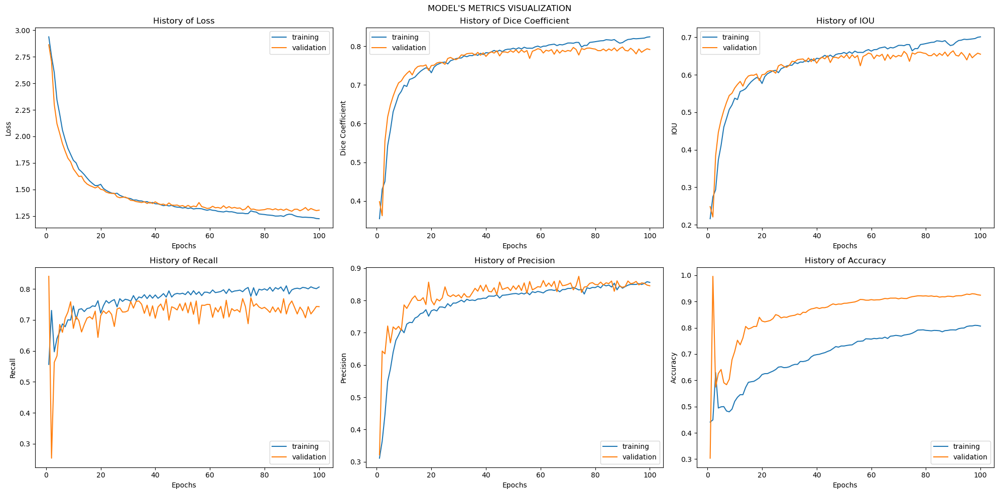

In [14]:
def Train_Val_Plot(loss, val_loss, dice_score, val_dice_score, iou, val_iou, recall, val_recall, precision, val_precision, accuracy, val_accuracy):
    fig, axs = plt.subplots(2, 3, figsize=(20, 10))
    fig.suptitle("MODEL'S METRICS VISUALIZATION")

    # Loss plot
    axs[0, 0].plot(range(1, len(loss) + 1), loss)
    axs[0, 0].plot(range(1, len(val_loss) + 1), val_loss)
    axs[0, 0].set_title('History of Loss')
    axs[0, 0].set_xlabel('Epochs')
    axs[0, 0].set_ylabel('Loss')
    axs[0, 0].legend(['training', 'validation'])

    # Dice Coefficient plot
    axs[0, 1].plot(range(1, len(dice_score) + 1), dice_score)
    axs[0, 1].plot(range(1, len(val_dice_score) + 1), val_dice_score)
    axs[0, 1].set_title('History of Dice Coefficient')
    axs[0, 1].set_xlabel('Epochs')
    axs[0, 1].set_ylabel('Dice Coefficient')
    axs[0, 1].legend(['training', 'validation'])

    # Mean IOU plot
    axs[0, 2].plot(range(1, len(iou) + 1), iou)
    axs[0, 2].plot(range(1, len(val_iou) + 1), val_iou)
    axs[0, 2].set_title('History of IOU')
    axs[0, 2].set_xlabel('Epochs')
    axs[0, 2].set_ylabel('IOU')
    axs[0, 2].legend(['training', 'validation'])

    # Recall plot
    axs[1, 0].plot(range(1, len(recall) + 1), recall)
    axs[1, 0].plot(range(1, len(val_recall) + 1), val_recall)
    axs[1, 0].set_title('History of Recall')
    axs[1, 0].set_xlabel('Epochs')
    axs[1, 0].set_ylabel('Recall')
    axs[1, 0].legend(['training', 'validation'])

    # Precision plot
    axs[1, 1].plot(range(1, len(precision) + 1), precision)
    axs[1, 1].plot(range(1, len(val_precision) + 1), val_precision)
    axs[1, 1].set_title('History of Precision')
    axs[1, 1].set_xlabel('Epochs')
    axs[1, 1].set_ylabel('Precision')
    axs[1, 1].legend(['training', 'validation'])

    # Accuracy plot
    axs[1, 2].plot(range(1, len(accuracy) + 1), accuracy)
    axs[1, 2].plot(range(1, len(val_accuracy) + 1), val_accuracy)
    axs[1, 2].set_title('History of Accuracy')
    axs[1, 2].set_xlabel('Epochs')
    axs[1, 2].set_ylabel('Accuracy')
    axs[1, 2].legend(['training', 'validation'])

    plt.tight_layout()
    plt.show()

Train_Val_Plot(
    history.history['loss'], history.history['val_loss'],
    history.history['dice_score'], history.history['val_dice_score'],
    history.history['iou'], history.history['val_iou'],
    history.history['recall'], history.history['val_recall'],
    history.history['precision'], history.history['val_precision'],
    history.history['accuracy'], history.history['val_accuracy']
)

In [15]:
model.load_weights("/kaggle/working/model.h5")
model.evaluate(test_dataset, batch_size = 8, verbose = 1)

2/2 [==============================] - 0s 120ms/step - loss: 1.3347 - accuracy: 0.9168 - precision: 0.7766 - recall: 0.8027 - dice_score: 0.7897 - iou: 0.6529


[1.3346598148345947,
 0.916778564453125,
 0.7766455411911011,
 0.8027360439300537,
 0.78969407081604,
 0.6528542041778564]

#### Segmentation output

##### Spatial

In [18]:
modeller = Model(inputs=model.input, outputs=[model.get_layer(name="ackley_function_layer").output,model.get_layer(name="ackley_function_layer_1").output,model.get_layer(name="tf.math.sqrt").output,model.layers[-2].output])

1/1 [==============================] - 5s 5s/step


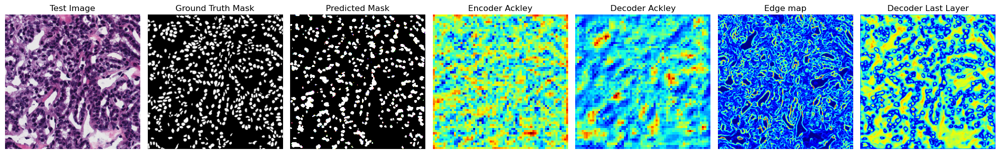

1/1 [==============================] - 0s 28ms/step


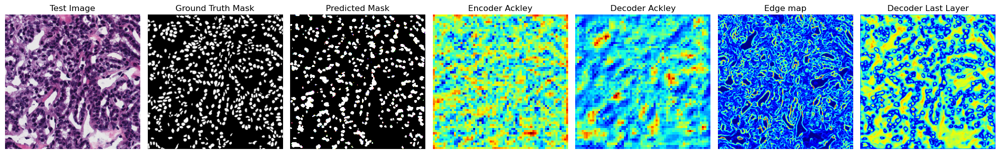

1/1 [==============================] - 0s 26ms/step


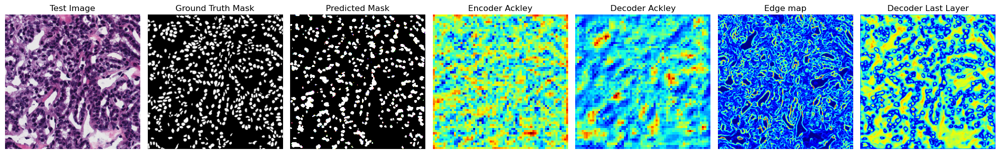

1/1 [==============================] - 0s 25ms/step


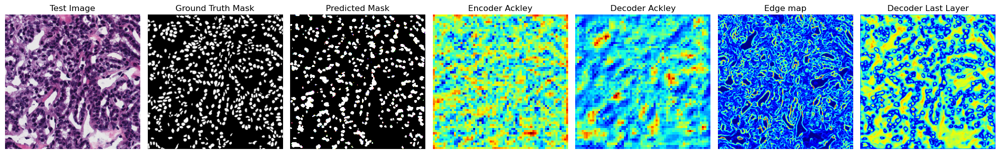

1/1 [==============================] - 0s 25ms/step


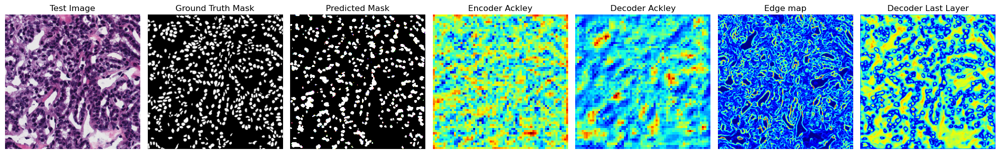

1/1 [==============================] - 0s 27ms/step


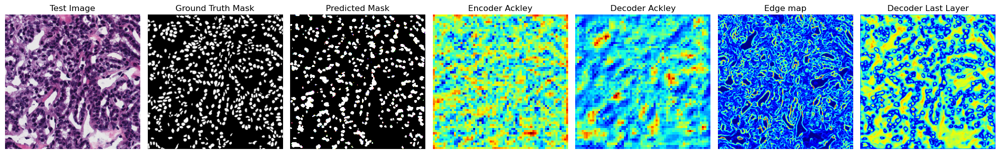

1/1 [==============================] - 0s 28ms/step


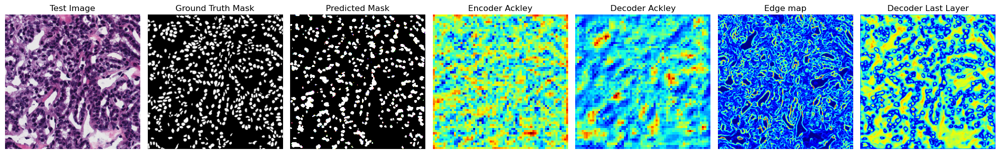

1/1 [==============================] - 0s 28ms/step


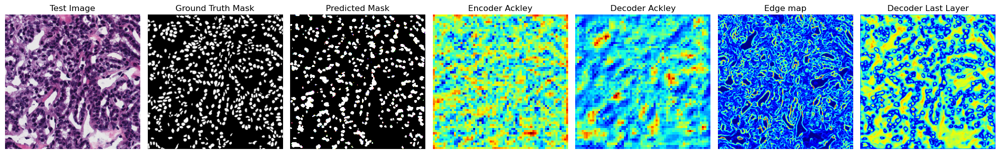

1/1 [==============================] - 0s 26ms/step


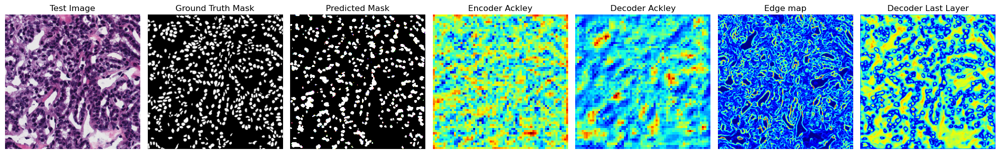

1/1 [==============================] - 0s 29ms/step


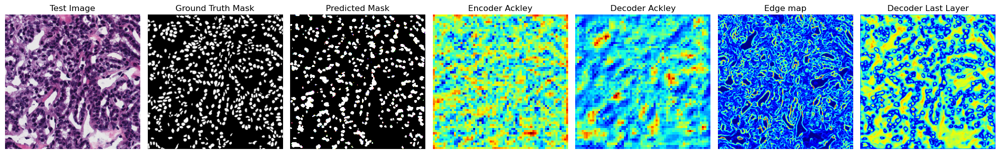

1/1 [==============================] - 0s 25ms/step


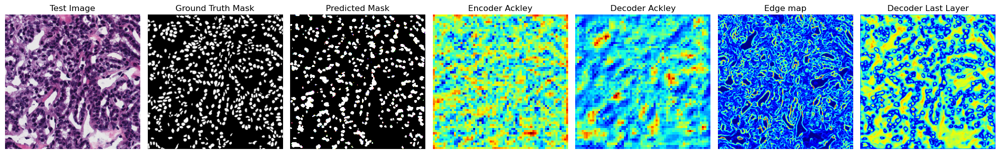

1/1 [==============================] - 0s 27ms/step


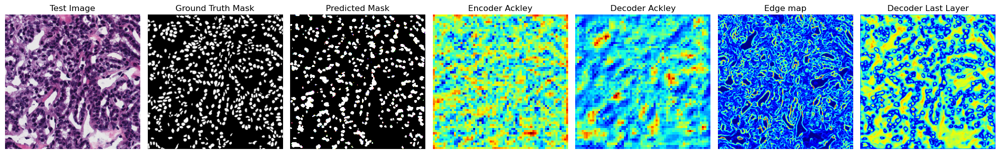

1/1 [==============================] - 0s 28ms/step


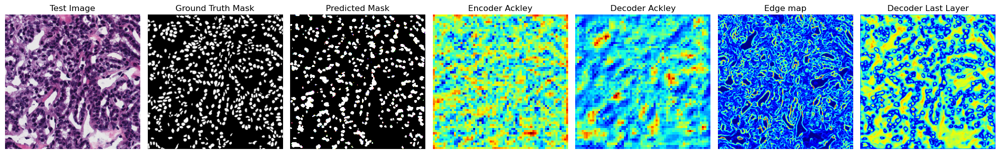

1/1 [==============================] - 0s 25ms/step


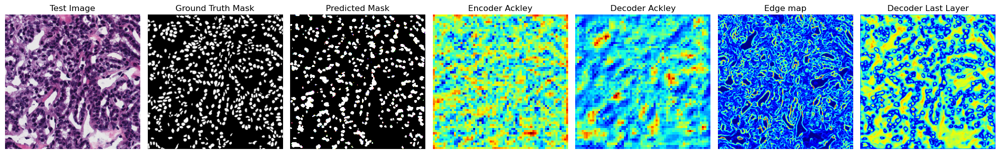

1/1 [==============================] - 0s 32ms/step


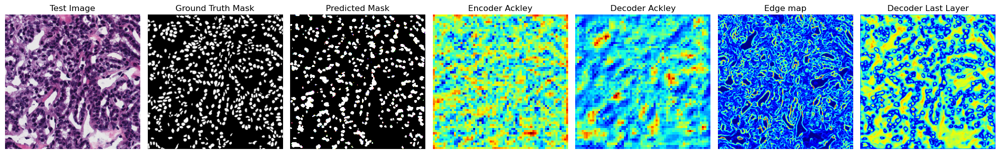

In [19]:
for z in range(0,15):
    # Load one image and corresponding mask from the test dataset
    test_image = X_test[0]  # Replace X_test with your actual test dataset
    test_mask = y_test[0]  # Replace y_test with your actual test masks

    # Reshape the image to match the input shape of the model
    test_image = np.reshape(test_image, (1,) + test_image.shape)

    # Predict the segmentation mask for the test image
    predicted_mask = model.predict(test_image)[0]
    feature_map1, feature_map2, feature_map3, feature_map4 = modeller.predict(test_image)
    feature_map1 = tf.math.reduce_mean(feature_map1, axis=-1, keepdims=True)
    feature_map2 = tf.math.reduce_mean(feature_map2, axis=-1, keepdims=True)
    feature_map3 = tf.math.reduce_mean(feature_map3, axis=-1, keepdims=True)
    feature_map4 = tf.math.reduce_mean(feature_map4, axis=-1, keepdims=True)

    # Convert the predicted mask values to binary (0 or 1)
    predicted_mask_binary = np.where(predicted_mask > 0.5, 1, 0) * 255

    # Create subplots
    fig, axes = plt.subplots(1, len(feature_map1) + 6, figsize=(20, 4))

    # Plot the test image
    axes[0].imshow(test_image[0], cmap='gray')
    axes[0].set_title('Test Image')
    axes[0].axis('off')

    # Plot the ground truth mask
    axes[1].imshow(test_mask, cmap='gray')
    axes[1].set_title('Ground Truth Mask')
    axes[1].axis('off')

    # Plot the predicted mask
    axes[2].imshow(predicted_mask_binary, cmap='gray')
    axes[2].set_title('Predicted Mask')
    axes[2].axis('off')

    # Plot the feature maps (Set 1)
    for i, fmap in enumerate(feature_map1):
        axes[i + 3].imshow(fmap[:, :, 0], cmap='jet')
        axes[i + 3].set_title(f'Encoder Ackley')
        axes[i + 3].axis('off')

    # Plot the feature maps (Set 2)
    for i, fmap in enumerate(feature_map2):
        axes[i + 3 + len(feature_map1)].imshow(fmap[:, :, 0], cmap='jet')
        axes[i + 3 + len(feature_map1)].set_title(f'Decoder Ackley')
        axes[i + 3 + len(feature_map1)].axis('off')
        
    # Plot the feature maps (Set 3)
    for i, fmap in enumerate(feature_map3):
        axes[i + 3 + len(feature_map1) + len(feature_map2)].imshow(fmap[:, :, 0], cmap='jet')
        axes[i + 3 + len(feature_map1) + len(feature_map2)].set_title(f'Edge map')
        axes[i + 3 + len(feature_map1) + len(feature_map2)].axis('off')

    # Plot the feature maps (Set 4)
    for i, fmap in enumerate(feature_map4):
        axes[i + 3 + len(feature_map1) + len(feature_map2) + len(feature_map3)].imshow(fmap[:, :, 0], cmap='jet')
        axes[i + 3 + len(feature_map1) + len(feature_map2) + len(feature_map3)].set_title(f'Decoder Last Layer')
        axes[i + 3 + len(feature_map1) + len(feature_map2) + len(feature_map3)].axis('off')

    plt.tight_layout()
    plt.show()